In [1]:
# !pip install --upgrade pip
# !pip install -r requirements.txt

# 01 Librerías

In [2]:
import os 
import pandas as pd
import geopandas as gpd
import numpy as np
import warnings
from collections import defaultdict

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

import sklearn.impute as skl_imp
from libpysal import weights
from sklearn.experimental import enable_iterative_imputer
from sklearn.preprocessing import LabelEncoder

from common.utils import *

warnings.filterwarnings("ignore")

# 02 Carga de Datos

In [3]:
path_in = os.path.join(os.getcwd(), 'data/input/')
path_out = os.path.join(os.getcwd(), 'data/output/')

In [4]:
paths = [path_in, path_out]
for path in paths:
    os.makedirs(path, exist_ok=True)

In [5]:
file_labels = os.path.join(path_in, 'training-set-labels.csv')
file_values = os.path.join(path_in, 'training-set-values.csv')
file_test = os.path.join(path_in, 'test-set-values.csv')

In [6]:
df_train_labels = pd.read_csv(file_labels)
df_train_values = pd.read_csv(file_values)
df_test_values = pd.read_csv(file_test)

In [7]:
df_train_labels.shape, df_train_values.shape

((59400, 2), (59400, 40))

In [8]:
# unificamos las etiquetas de entrenamiento con los valores de entrenamiento en un dataframe
DataTrain = df_train_labels.merge(df_train_values, on='id')

# 03 EDA

## 03.01 Información y descripción del dataset

In [9]:
# definimos data_recorded como datetime
DataTrain.date_recorded = pd.to_datetime(DataTrain.date_recorded)

In [10]:
DataTrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     59400 non-null  int64         
 1   status_group           59400 non-null  object        
 2   amount_tsh             59400 non-null  float64       
 3   date_recorded          59400 non-null  datetime64[ns]
 4   funder                 55763 non-null  object        
 5   gps_height             59400 non-null  int64         
 6   installer              55745 non-null  object        
 7   longitude              59400 non-null  float64       
 8   latitude               59400 non-null  float64       
 9   wpt_name               59398 non-null  object        
 10  num_private            59400 non-null  int64         
 11  basin                  59400 non-null  object        
 12  subvillage             59029 non-null  object        
 13  r

In [11]:
# identificamos valores únicos
DataTrain.nunique()

id                       59400
status_group                 3
amount_tsh                  98
date_recorded              356
funder                    1896
gps_height                2428
installer                 2145
longitude                57516
latitude                 57517
wpt_name                 37399
num_private                 65
basin                        9
subvillage               19287
region                      21
region_code                 27
district_code               20
lga                        125
ward                      2092
population                1049
public_meeting               2
recorded_by                  1
scheme_management           11
scheme_name               2695
permit                       2
construction_year           55
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_qu

In [12]:
# identificamos aquellas variables númericas
DataTrain.select_dtypes(include=['int', 'float']).describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [13]:
# identificamos variables categóricas
DataTrain.select_dtypes(exclude=['int', 'float', 'datetime']).describe()

,status_group,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
count,59400,55763,55745,59398,59400,59029,59400,59400,59400,56066,...,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400
unique,3,1896,2145,37399,9,19287,21,125,2092,2,...,7,8,6,5,5,10,7,3,7,6
top,functional,Government Of Tanzania,DWE,none,Lake Victoria,Madukani,Iringa,Njombe,Igosi,True,...,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
freq,32259,9084,17402,3563,10248,508,5294,2503,307,51011,...,25348,50818,50818,33186,33186,17021,17021,45794,28522,34625


In [14]:
# seleccionamos las variables categóricas, no binarias
cols_str = DataTrain.loc[:,DataTrain.nunique() > 2].select_dtypes(exclude=['int', 'float', 'datetime']).columns.tolist()

In [15]:
# realizamos limpieza primaria
DataTrain[cols_str] = DataTrain[cols_str].apply(lambda x: x.str.strip())
DataTrain[cols_str] = DataTrain[cols_str].apply(lambda x: x.str.lower())

## 03.02 Identificación de potenciales variables categóricas

### 03.02.01 Variables texto y numéricas

In [16]:
# definimos un dataset temporal que contengan aquellas variables con igual o menor a 30 valores únicos
df_temp = DataTrain.loc[:,DataTrain.nunique() <= 30]

In [17]:
cols = [pd.unique(df_temp[col]) for col in df_temp.columns]

In [18]:
unique_values_df = pd.DataFrame()
for col in cols:
    additional_cols = pd.DataFrame(col)
    unique_values_df = pd.concat([unique_values_df, additional_cols], axis=1)

In [19]:
# visualizamos en un dataframe todas las variables y sus valores
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

unique_values_df.columns = df_temp.columns
unique_values_df.apply(lambda x: x.sort_values().values)

,status_group,basin,region,region_code,district_code,public_meeting,recorded_by,scheme_management,permit,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,functional,internal,arusha,1,0.0,False,GeoData Consultants Ltd,company,False,afridev,afridev,gravity,company,commercial,never pay,annually,coloured,colored,dry,dry,dam,borehole,groundwater,cattle trough,cattle trough
1,functional needs repair,lake nyasa,dar es salaam,2,1.0,True,NaN,other,True,cemo,gravity,handpump,other,other,other,monthly,fluoride,fluoride,enough,enough,hand dtw,dam,surface,communal standpipe,communal standpipe
2,non functional,lake rukwa,dodoma,3,2.0,NaN,NaN,parastatal,NaN,climax,india mark ii,motorpump,other - school,parastatal,pay annually,never pay,fluoride abandoned,good,insufficient,insufficient,lake,other,unknown,communal standpipe multiple,dam
3,NaN,lake tanganyika,iringa,4,3.0,NaN,NaN,private operator,NaN,gravity,india mark iii,other,parastatal,unknown,pay monthly,on failure,milky,milky,seasonal,seasonal,machine dbh,rainwater harvesting,NaN,dam,hand pump
4,NaN,lake victoria,kagera,5,4.0,NaN,NaN,swc,NaN,india mark ii,mono,rope pump,private operator,user-group,pay per bucket,other,salty,salty,unknown,unknown,other,river/lake,NaN,hand pump,improved spring
5,NaN,pangani,kigoma,6,5.0,NaN,NaN,trust,NaN,india mark iii,nira/tanira,submersible,trust,NaN,pay when scheme fails,per bucket,salty abandoned,unknown,NaN,NaN,rainwater harvesting,shallow well,NaN,improved spring,other
6,NaN,rufiji,kilimanjaro,7,6.0,NaN,NaN,vwc,NaN,ksb,other,wind-powered,unknown,NaN,unknown,unknown,soft,NaN,NaN,NaN,river,spring,NaN,other,NaN
7,NaN,ruvuma / southern coast,lindi,8,7.0,NaN,NaN,water authority,NaN,mono,other handpump,NaN,vwc,NaN,NaN,NaN,unknown,NaN,NaN,NaN,shallow well,NaN,NaN,NaN,NaN
8,NaN,wami / ruvu,manyara,9,8.0,NaN,NaN,water board,NaN,nira/tanira,other motorpump,NaN,water authority,NaN,NaN,NaN,NaN,NaN,NaN,NaN,spring,NaN,NaN,NaN,NaN
9,NaN,NaN,mara,10,13.0,NaN,NaN,wua,NaN,other,rope pump,NaN,water board,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,NaN,NaN,NaN,NaN


In [20]:
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 10)

In [21]:
# variables totales y sólo de texto
unique_values_df.shape, unique_values_df.select_dtypes(exclude=['int', 'float', 'datetime']).shape

((27, 25), (27, 23))

### 03.02.02 Análisis de frecuencia

In [22]:
cat = ['basin',
       'region',
       'region_code',
       'district_code',
       'public_meeting',
       'recorded_by',
       'scheme_management',
       'permit',
       'extraction_type',
       'extraction_type_group',
       'extraction_type_class',
       'management',
       'management_group',
       'payment',
       'payment_type',
       'water_quality',
       'quality_group',
       'quantity',
       'quantity_group',
       'source',
       'source_type',
       'source_class',
       'waterpoint_type',
       'waterpoint_type_group']

In [23]:
DataTrain[cat].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   basin                  59400 non-null  object
 1   region                 59400 non-null  object
 2   region_code            59400 non-null  int64 
 3   district_code          59400 non-null  int64 
 4   public_meeting         56066 non-null  object
 5   recorded_by            59400 non-null  object
 6   scheme_management      55522 non-null  object
 7   permit                 56344 non-null  object
 8   extraction_type        59400 non-null  object
 9   extraction_type_group  59400 non-null  object
 10  extraction_type_class  59400 non-null  object
 11  management             59400 non-null  object
 12  management_group       59400 non-null  object
 13  payment                59400 non-null  object
 14  payment_type           59400 non-null  object
 15  water_quality      

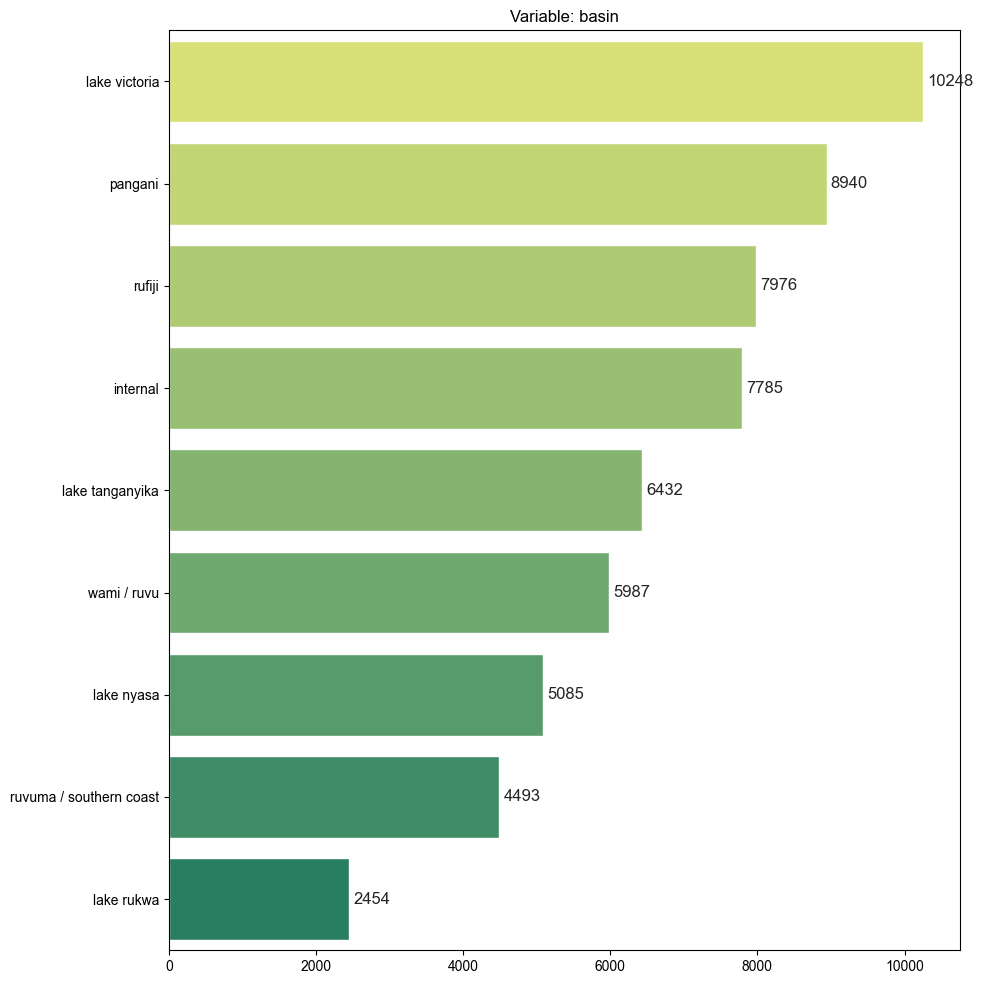

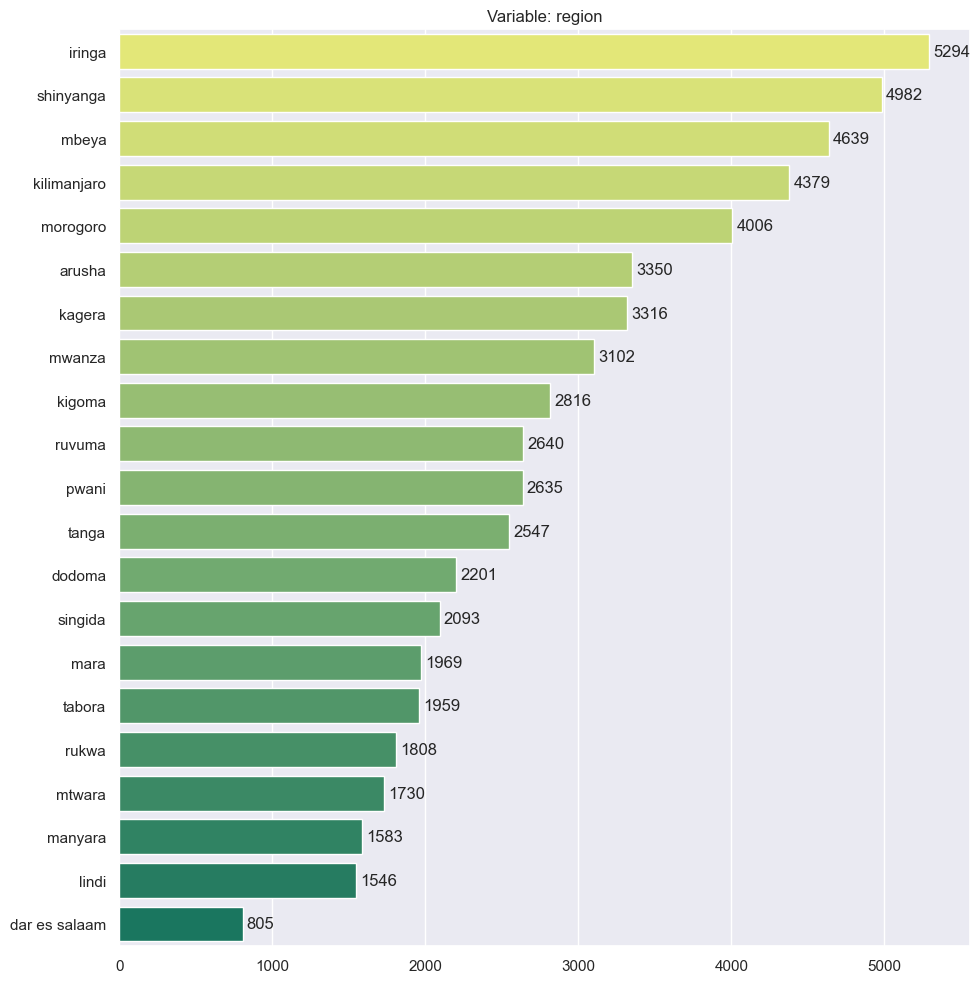

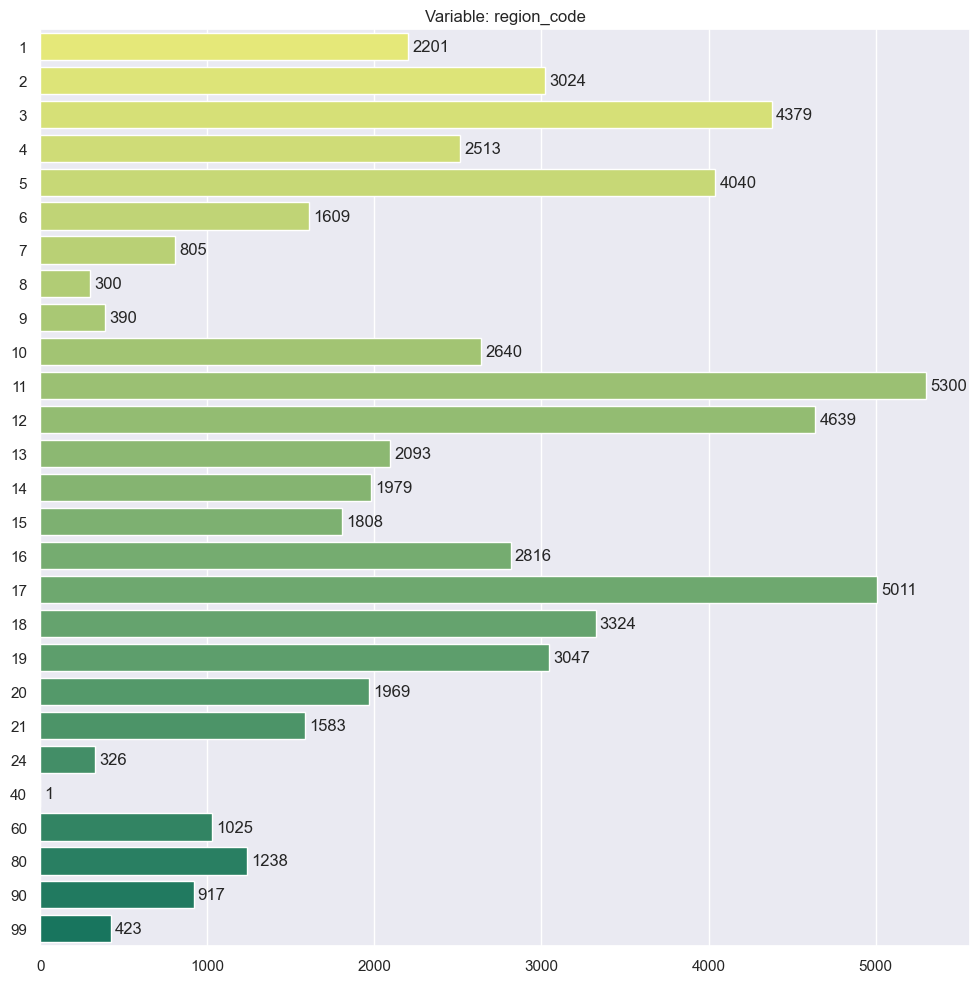

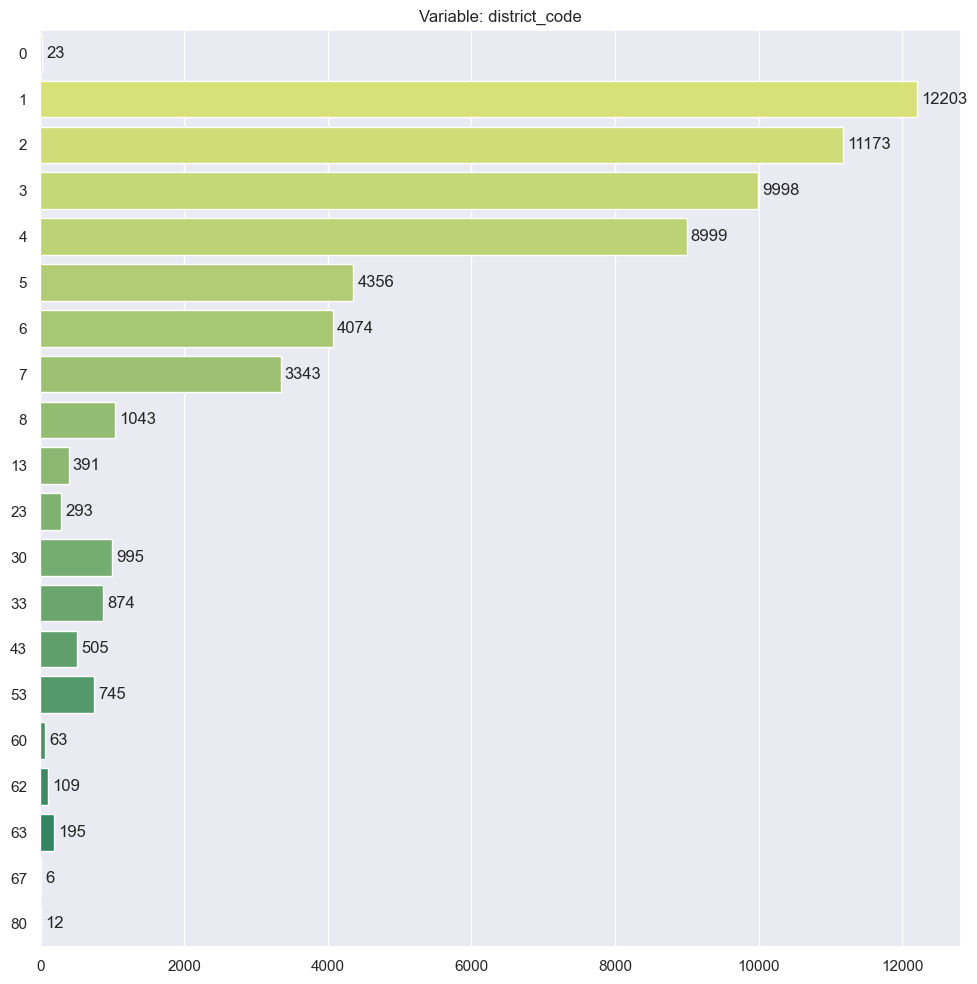

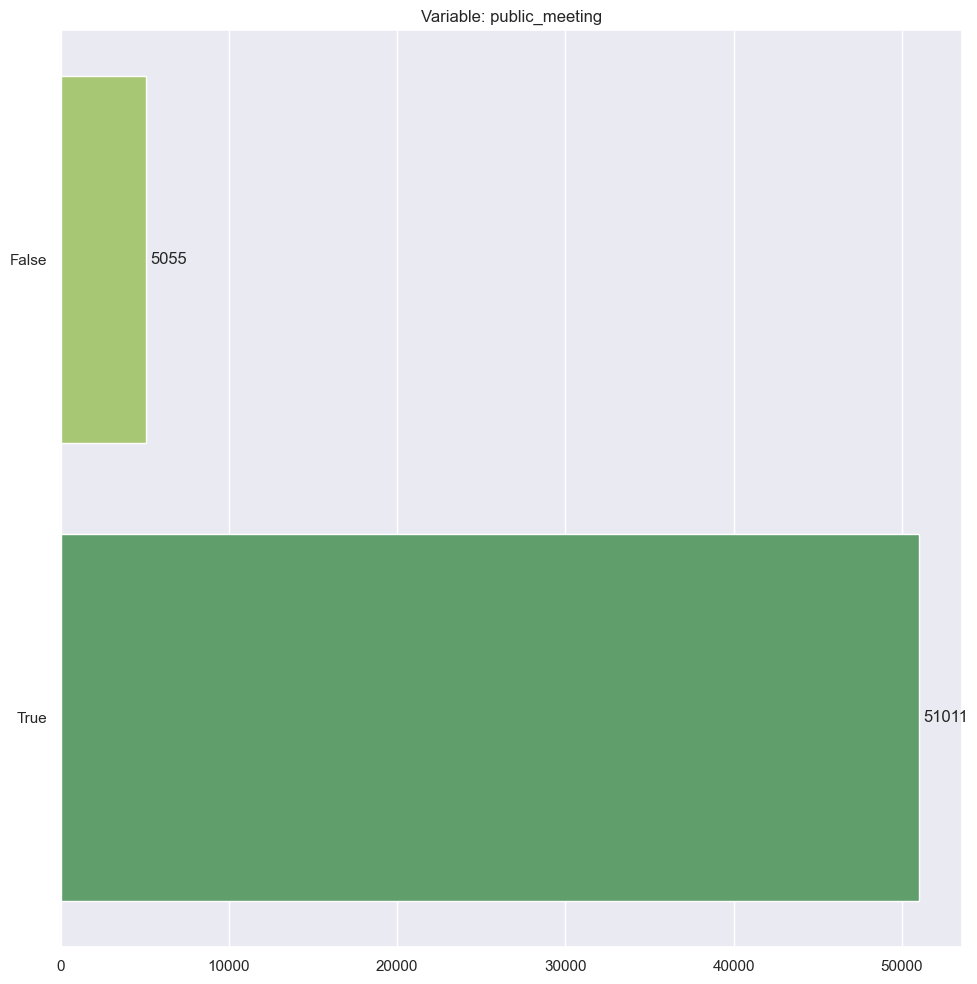

...

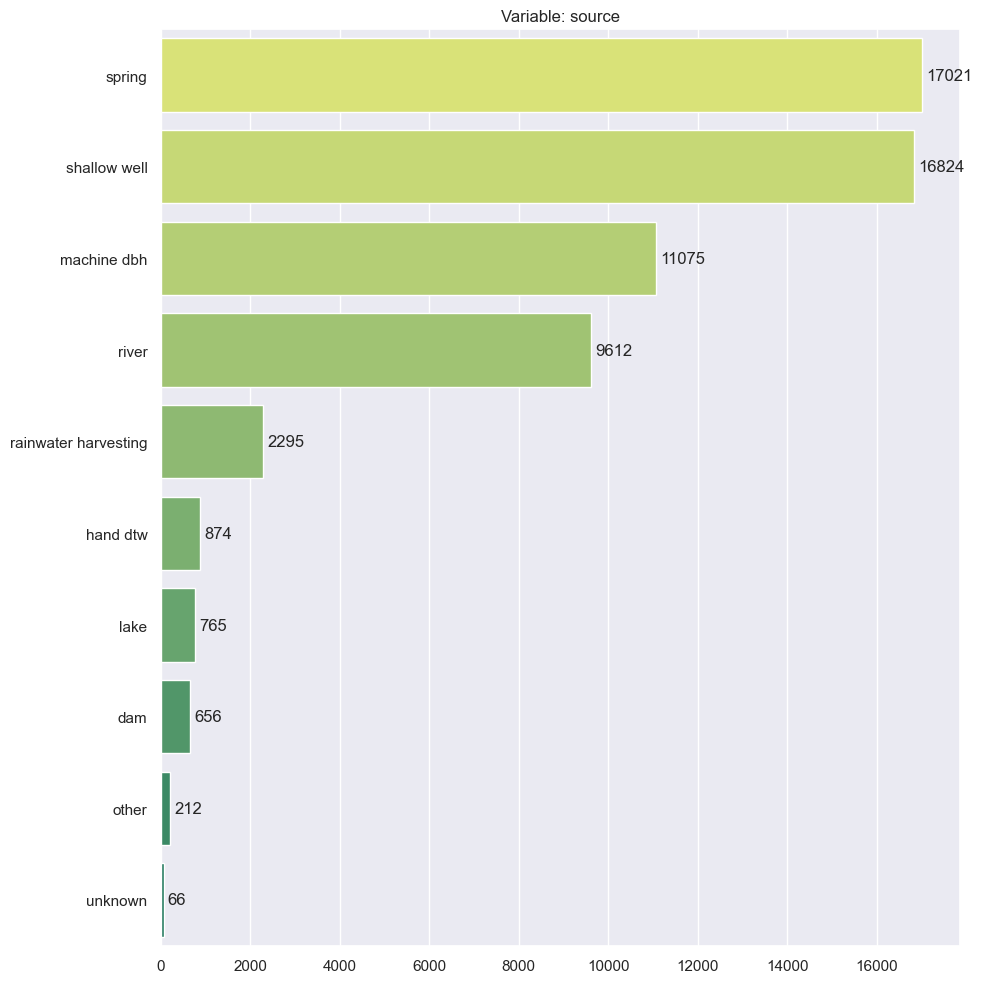

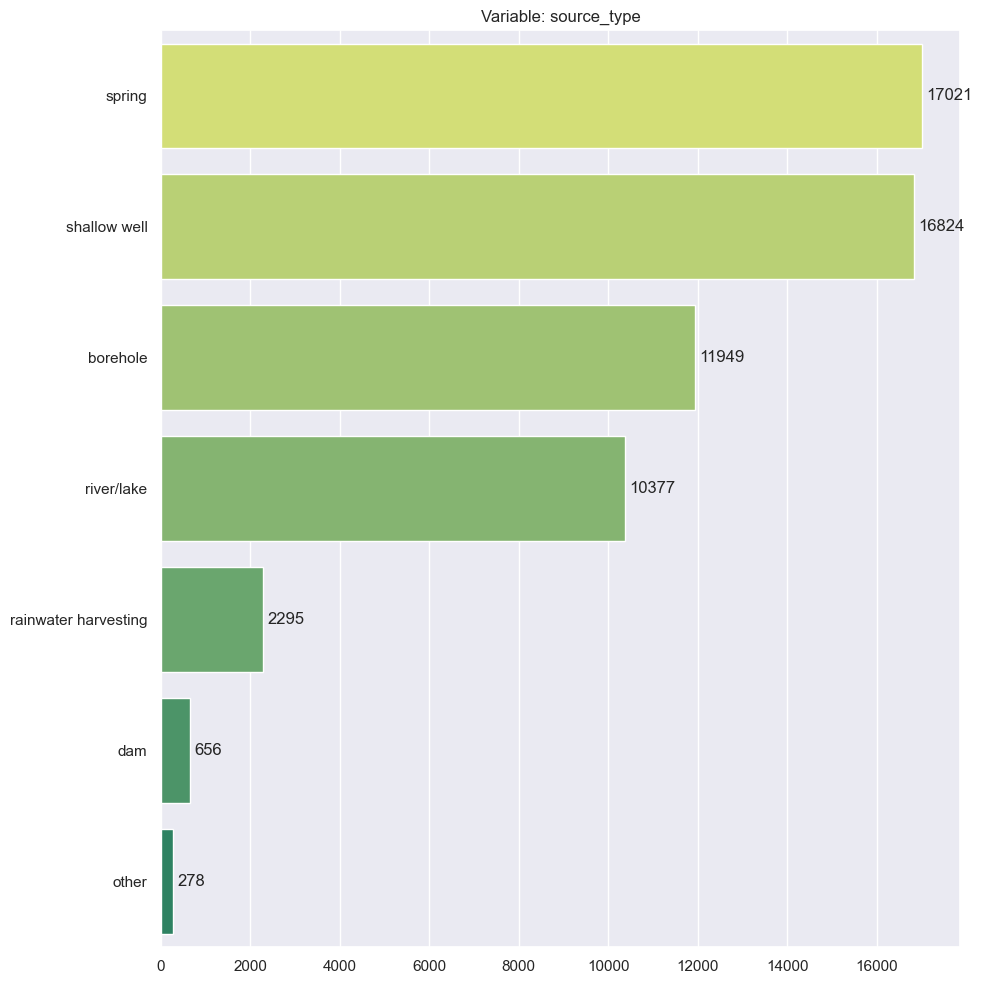

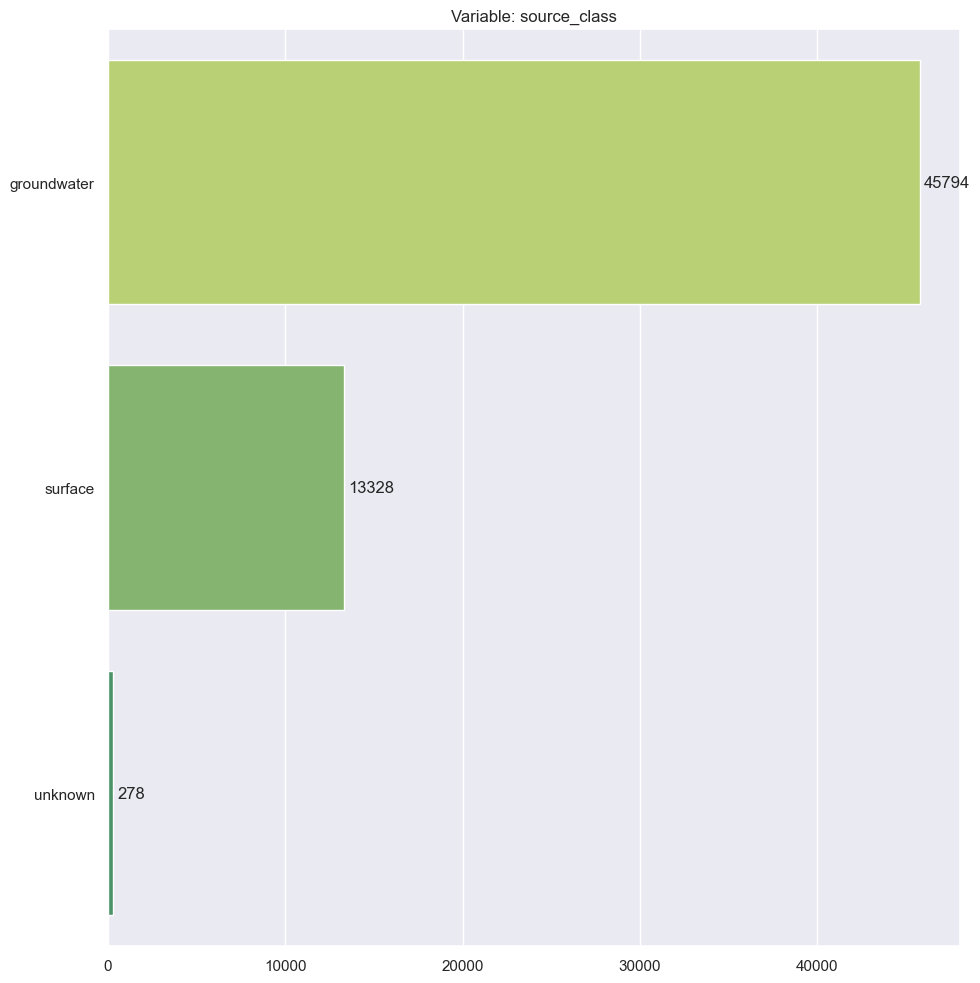

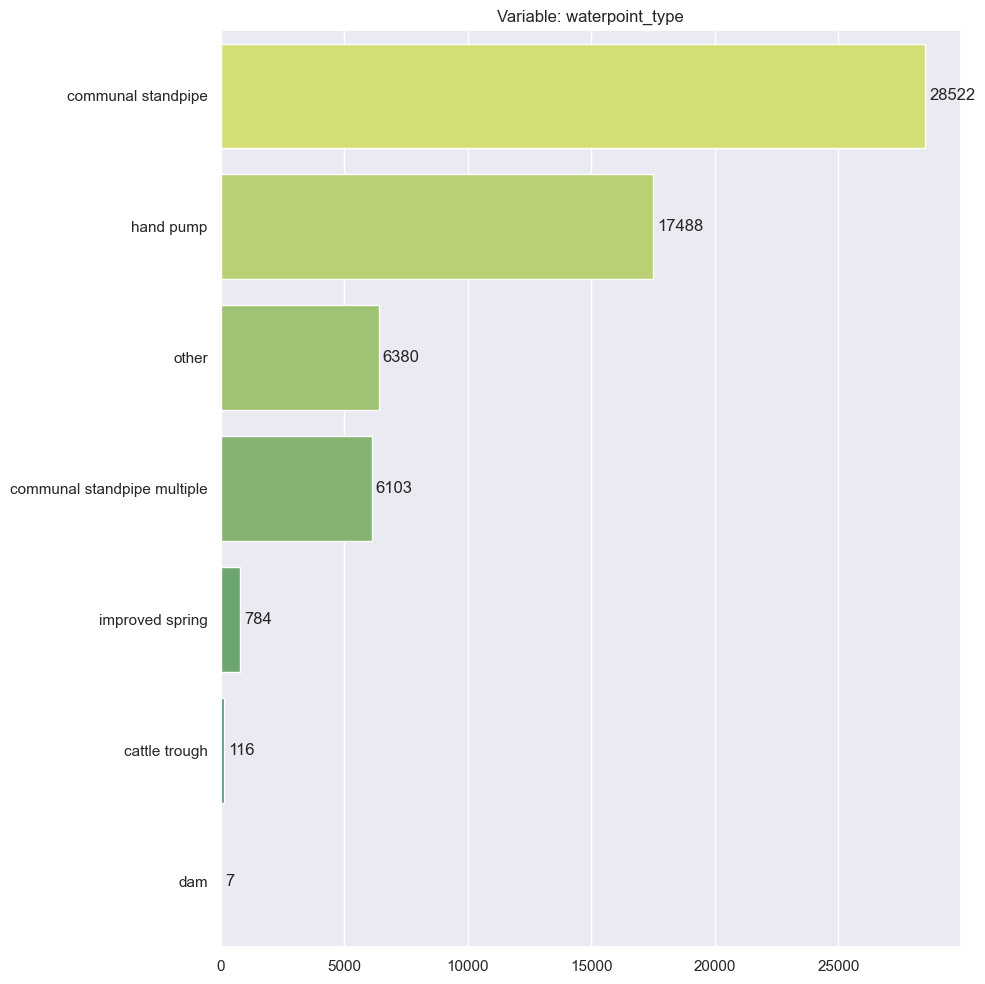

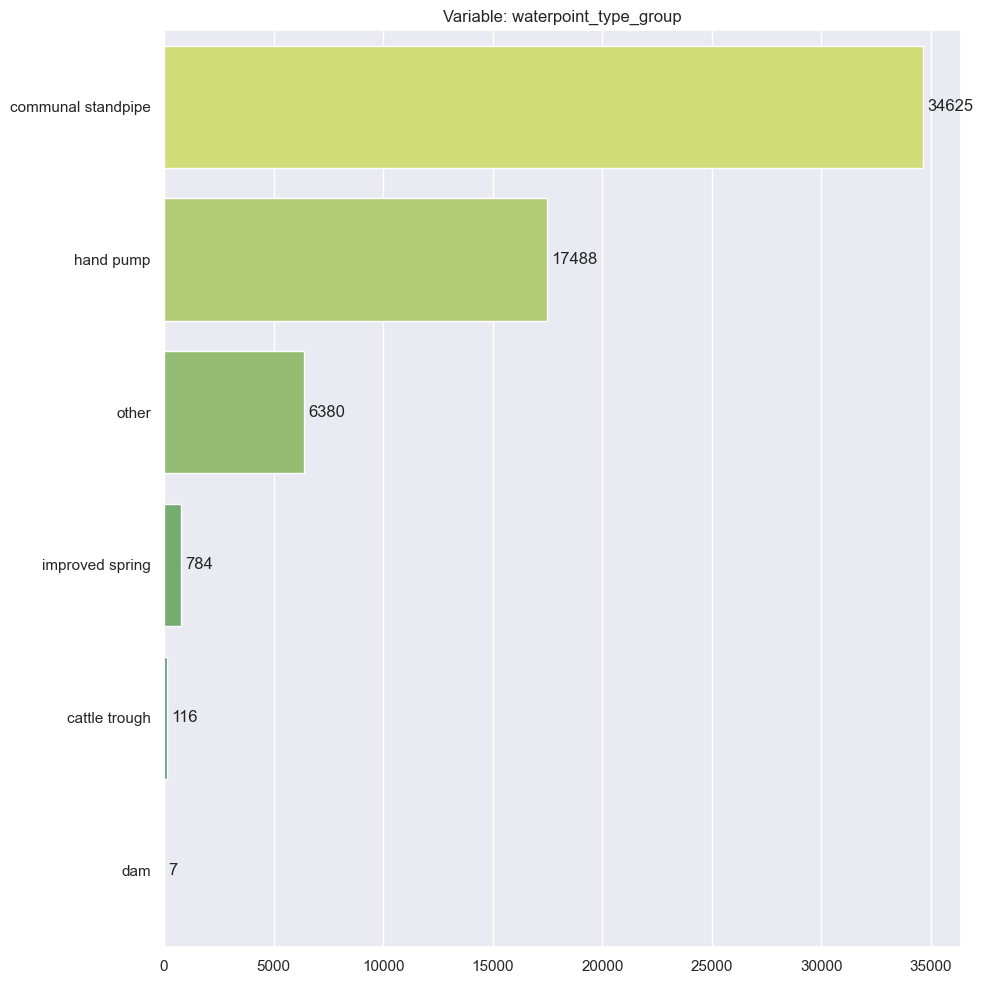

In [24]:
for col in DataTrain[cat].columns.tolist():
    # data
    data_sns = DataTrain[cat].groupby(col)[col].count().sort_values(ascending=False)
    data_sns = data_sns.iloc[:35]
    # chart
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.set_theme(rc={'figure.figsize':(10,15)})
    pal = sns.color_palette("summer", len(data_sns))
    sns.barplot(x=data_sns, y=data_sns.index, palette=reversed(pal), orient = 'h')
    for i in ax.containers:
        ax.bar_label(i, padding=3)
    ax.set_title(f'Variable: {col}')
    ax.set(xlabel=None, ylabel=None)
    ax.axis('on')
    plt.tight_layout()
    plt.show()

### 03.02.03 Evaluación scheme_name

In [25]:
# cantidad de nulos de scheme_name
sn_nperc = round(DataTrain.scheme_name.isnull().sum() * 100 / len(DataTrain), 2)
print(f'{sn_nperc}% de nulos')

48.5% de nulos


### 03.02.04 Búsqueda de correlaciones entre variables categóricas / utilizando v de cramer

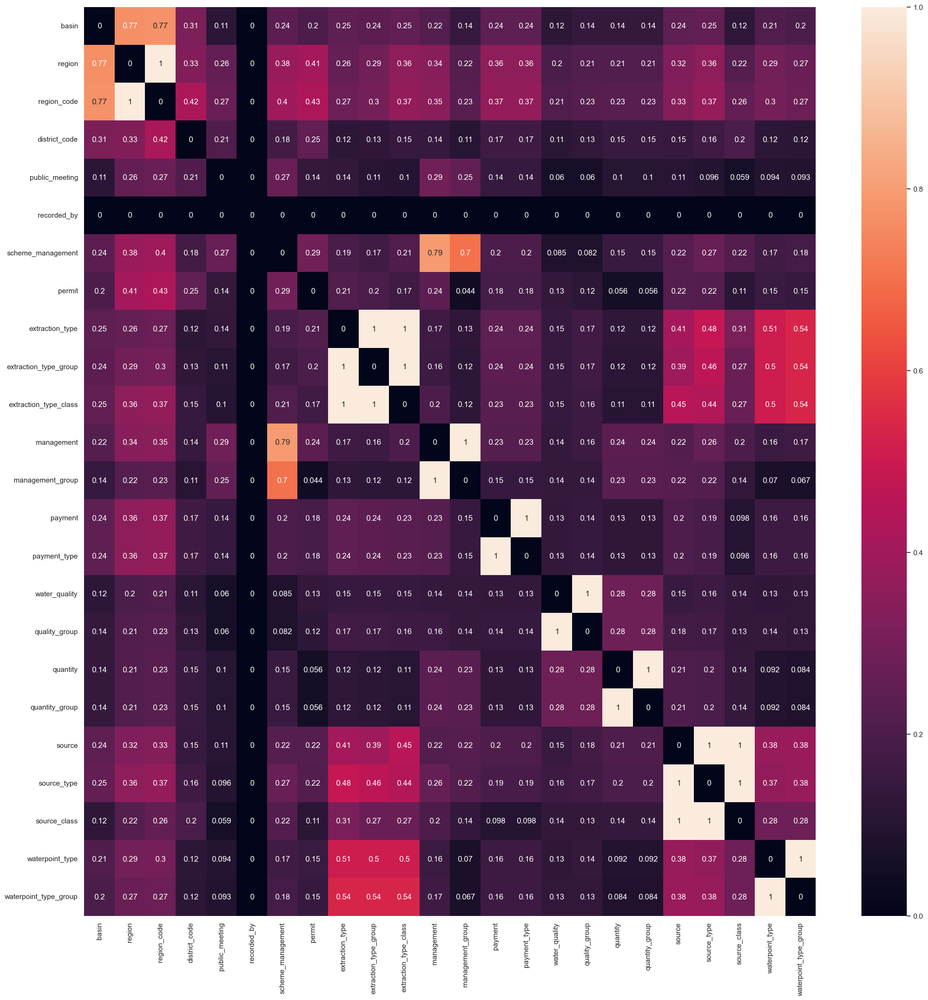

In [26]:
df = DataTrain[cat]

cramers_v_vals = pd.DataFrame(index=df.columns, columns=df.columns)
for col1 in df.columns:
    for col2 in df.columns:
        if col1 != col2:
            cramer = cramers_v(df[col1], df[col2])
            cramers_v_vals.loc[col1, col2] = cramer

# Replace NaN values with 0
cramers_v_vals.fillna(0, inplace=True)

# Create a heatmap
fig, ax = plt.subplots(figsize=(25, 25))
sns.heatmap(cramers_v_vals, annot=True)
plt.show()


## 03.03 Análisis de variables categoricas sobre 30 valores únicos (dirty categories)

### 03.03.01 Variables texto

In [27]:
# variables de texto totales
DataTrain.select_dtypes(exclude=['int', 'float', 'datetime']).head()

,status_group,funder,installer,wpt_name,basin,...,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,functional,roman,roman,none,lake nyasa,...,spring,spring,groundwater,communal standpipe,communal standpipe
1,functional,grumeti,grumeti,zahanati,lake victoria,...,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,functional,lottery club,world vision,kwa mahundi,pangani,...,dam,dam,surface,communal standpipe multiple,communal standpipe
3,non functional,unicef,unicef,zahanati ya nanyumbu,ruvuma / southern coast,...,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,functional,action in a,artisan,shuleni,lake victoria,...,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [28]:
# identificando variables de texto con multiples categorias
s1 = unique_values_df.select_dtypes(exclude=['int', 'float', 'datetime']).columns.tolist()
s2 = DataTrain.select_dtypes(exclude=['int', 'float', 'datetime']).columns.tolist()

In [29]:
other_strings_cols =  list(set(s1)^set(s2)) # xor / symetric difference

In [30]:
DataTrain[other_strings_cols].head()

,scheme_name,funder,lga,subvillage,installer,ward,wpt_name
0,roman,roman,ludewa,mnyusi b,roman,mundindi,none
1,NaN,grumeti,serengeti,nyamara,grumeti,natta,zahanati
2,nyumba ya mungu pipe scheme,lottery club,simanjiro,majengo,world vision,ngorika,kwa mahundi
3,NaN,unicef,nanyumbu,mahakamani,unicef,nanyumbu,zahanati ya nanyumbu
4,NaN,action in a,karagwe,kyanyamisa,artisan,nyakasimbi,shuleni


In [31]:
DataText = DataTrain[other_strings_cols]

In [32]:
DataText.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   scheme_name  30590 non-null  object
 1   funder       55763 non-null  object
 2   lga          59400 non-null  object
 3   subvillage   59029 non-null  object
 4   installer    55745 non-null  object
 5   ward         59400 non-null  object
 6   wpt_name     59398 non-null  object
dtypes: object(7)
memory usage: 3.2+ MB


In [33]:
DataText.nunique()

scheme_name     2576
funder          1896
lga              125
subvillage     19287
installer       1935
ward            2092
wpt_name       37399
dtype: int64

### 03.03.02 Distribución de caracteres

In [34]:
for col in DataText.columns.tolist():
    fig = px.histogram(DataText[col].apply(lambda x: len(str(x)))) 
    fig.show()


### 03.03.03 Análisis de frecuencia

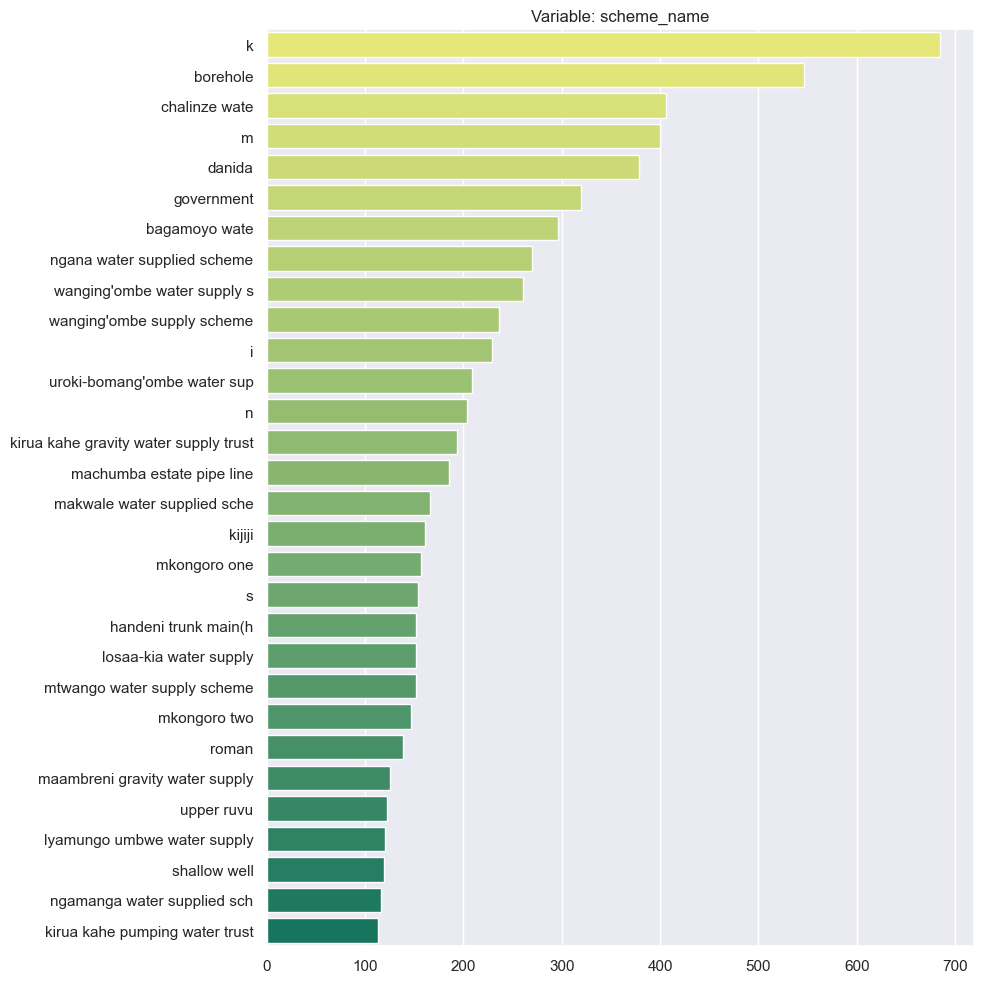

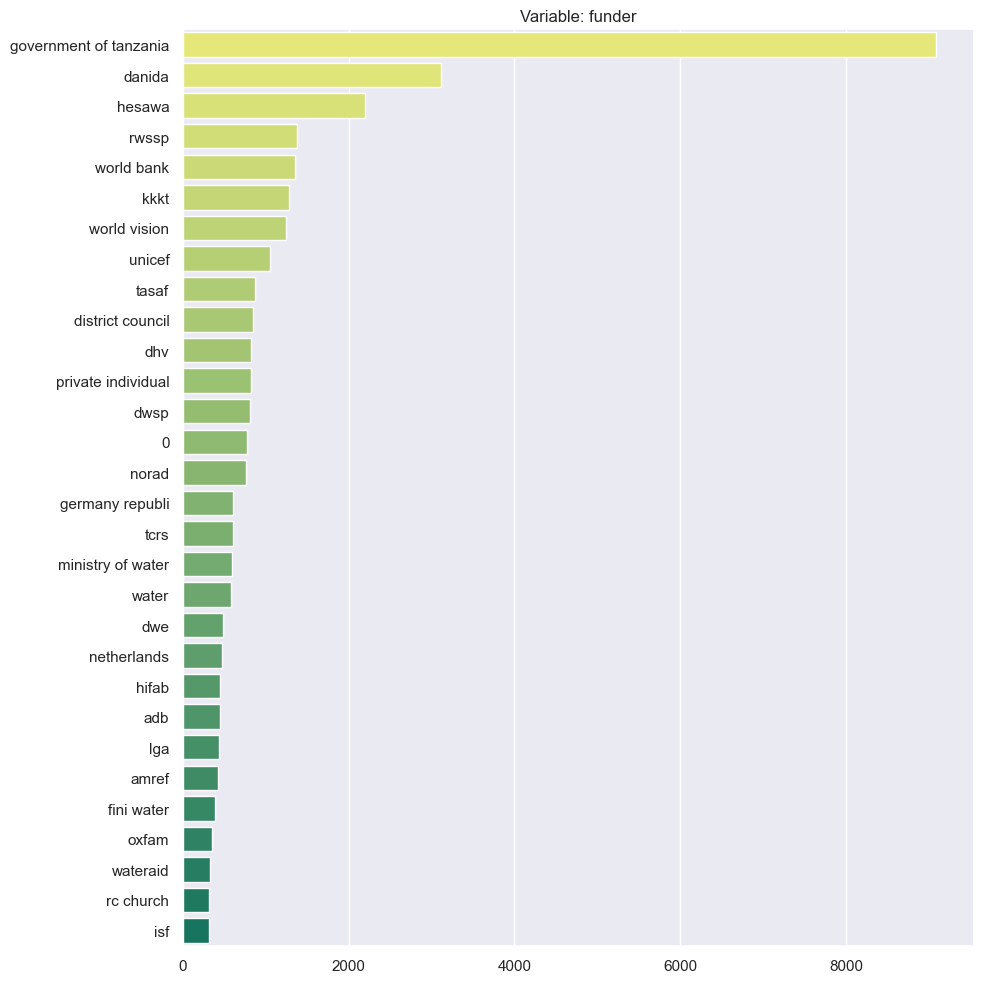

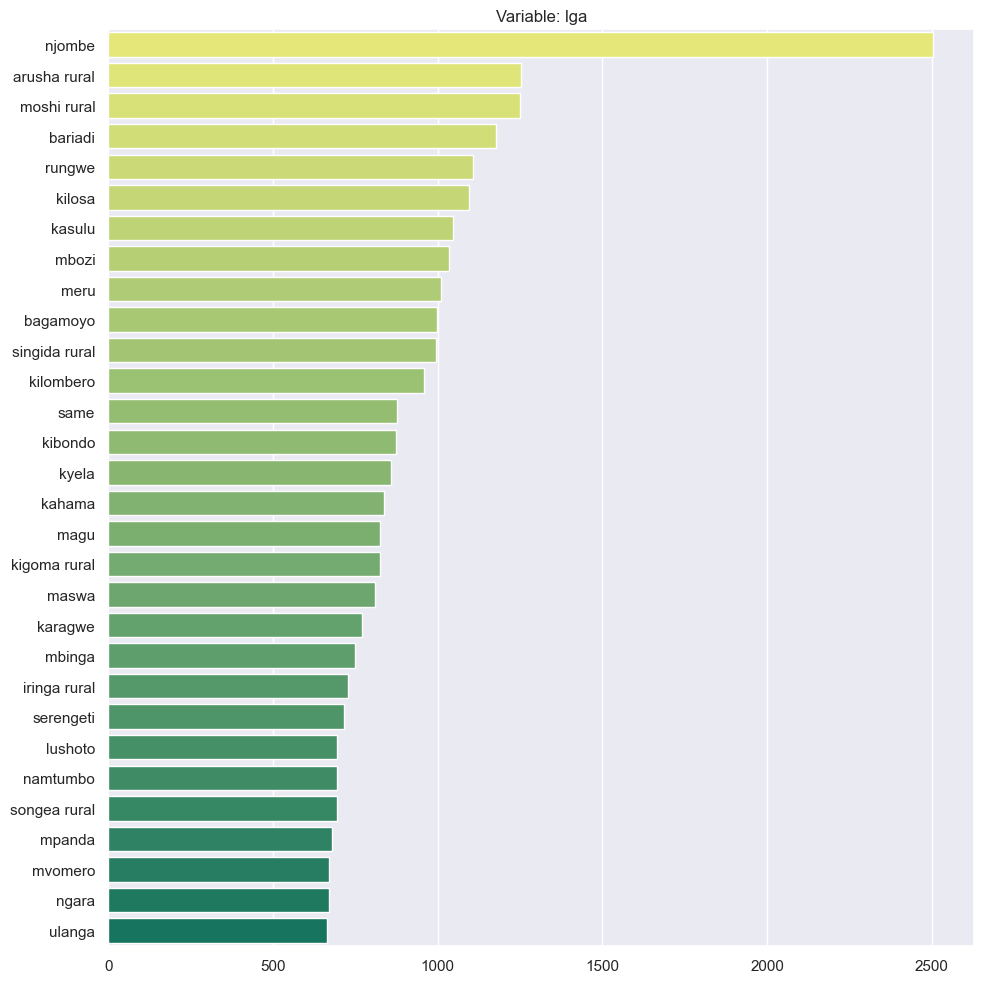

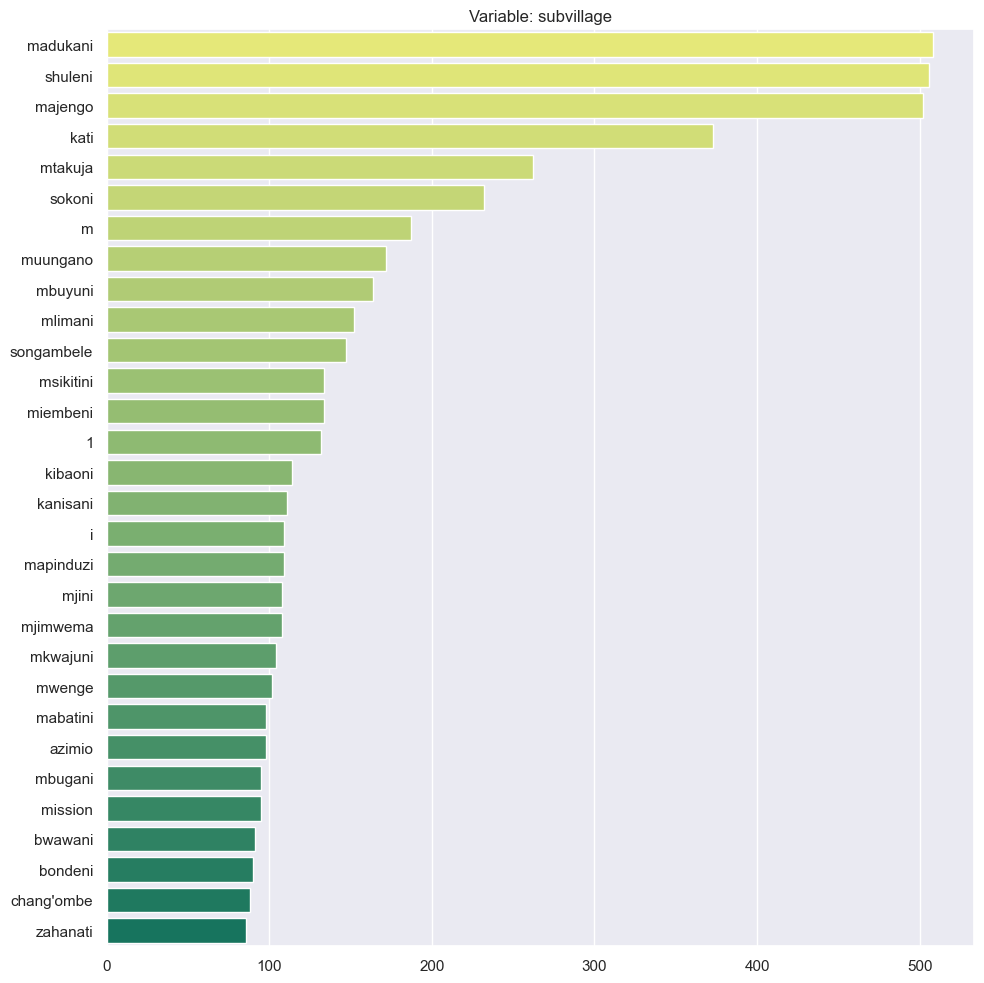

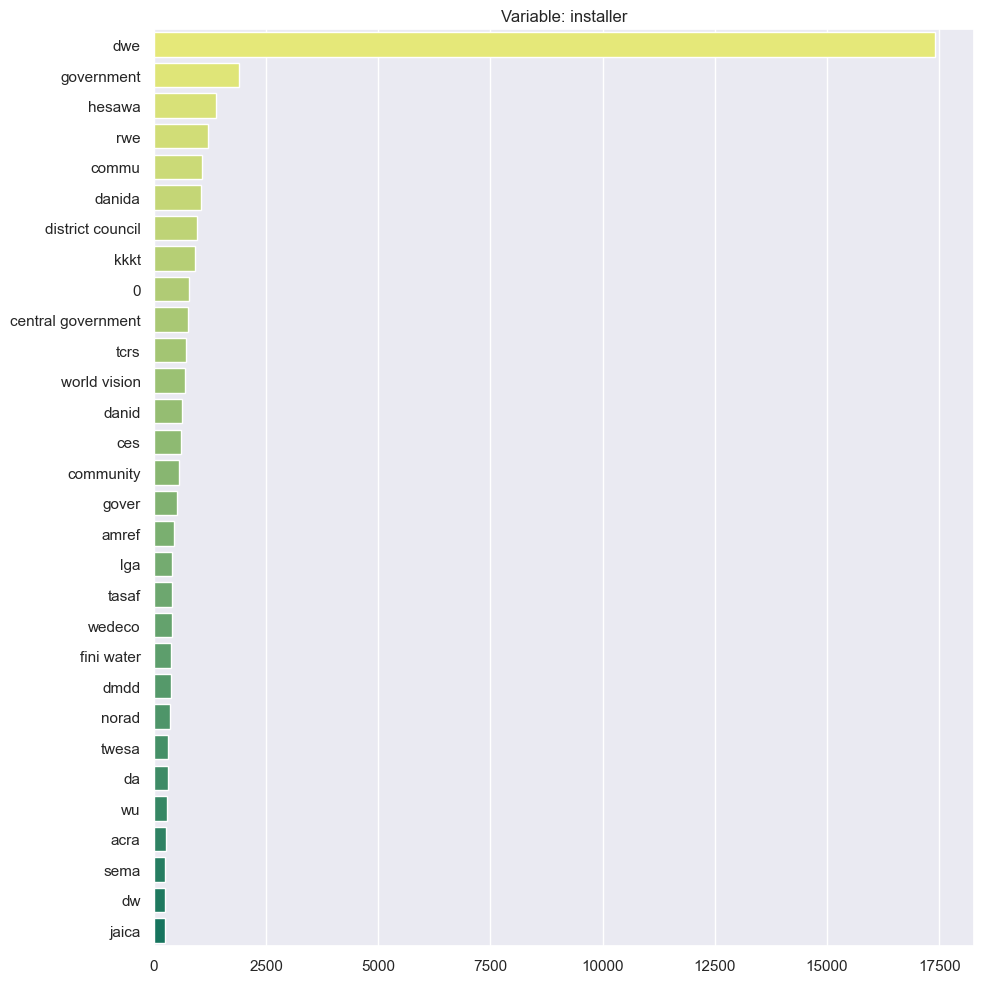

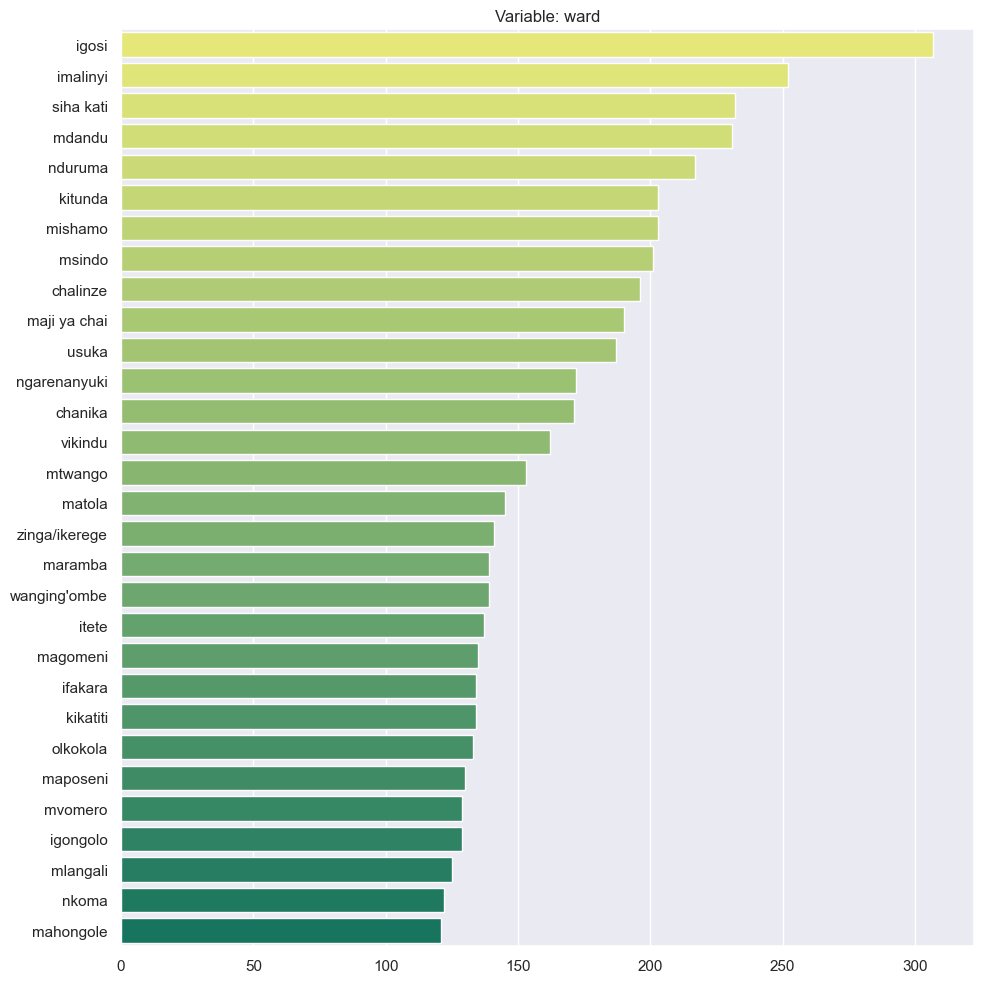

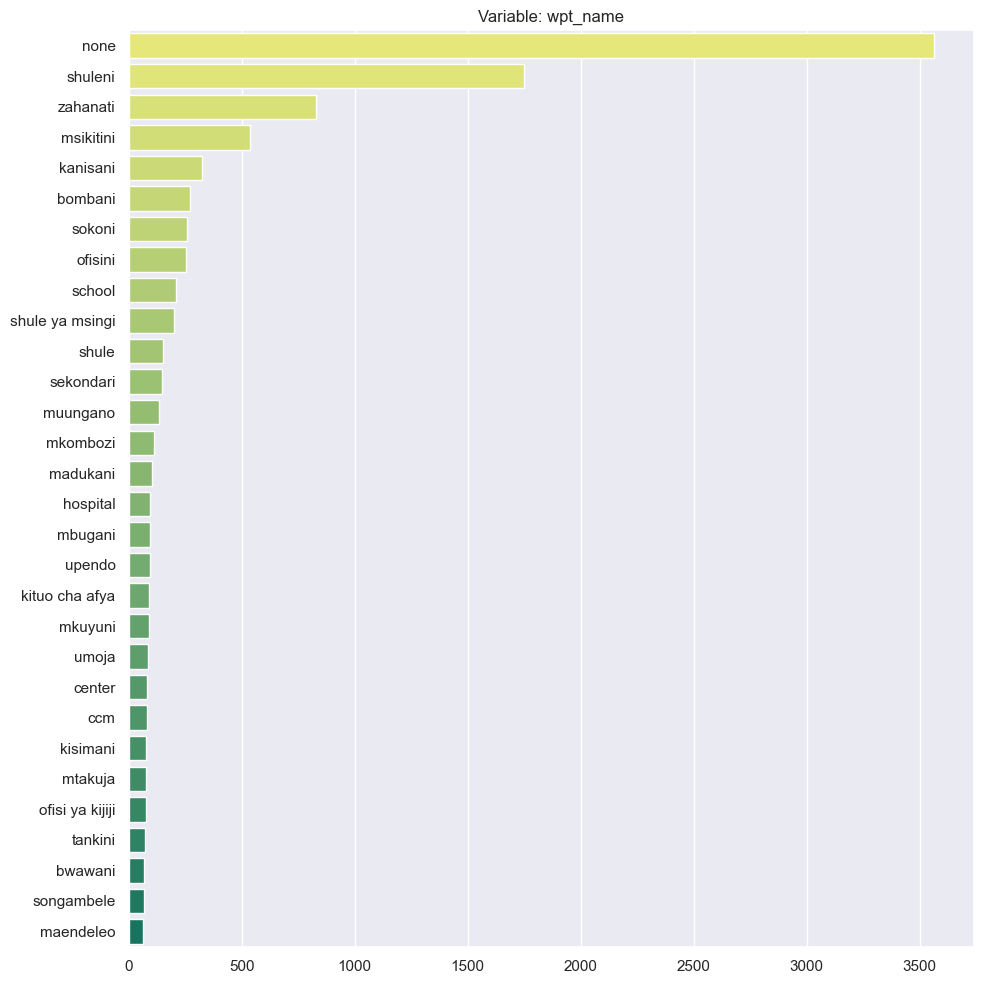

In [35]:
for col in DataText.columns.tolist():
    # data
    data_sns = DataText.groupby(col)[col].count().sort_values(ascending=False)
    data_sns = data_sns.iloc[:30]
    # chart
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.set_theme(rc={'figure.figsize':(10,15)})
    pal = sns.color_palette("summer", len(data_sns))
    sns.barplot(x=data_sns, y=data_sns.index, palette=reversed(pal), orient = 'h')
    ax.set_title(f'Variable: {col}')
    ax.set(xlabel=None, ylabel=None)
    plt.tight_layout()
    plt.show()

In [36]:
# imprimimos valores iguales o menores a 3 caracteres para cada variable con múltiples categorías
start = "\033[1m"
end = "\033[0;0m"
for col in DataText.columns.tolist():
    val = DataText[DataText[col].apply(lambda x: len(str(x))) <= 3][col].unique()
    print(f'{start}{col}{end}: {val}')

scheme_name: [nan 'k' 'm' 'b' 'n' 'kan' 's' 'mws' 'ma' 'fw' 'nyo' 'nzi' 'cdg' 'kit'
 'mt' 'iw' 'kwa' 'i' 'it' 'aic' 'rw' 'nya' 'ru' 'g' 'ga' 'mad' 'kib' 'u'
 'ki' 'w' 'uso' 'kw' 'l' 'mi' 'mv' 'du' 'd' 'me' 'ruz' 'a' 'ms' 'riv'
 'ded' 'mba' 'p' 'lu' 'e' 'sao' 't' 'obe' 'j' 'be' 'no' 'ch' 'zo' 'nke'
 'uto' 'adp' 'kag' 'uk' 'o' 'bug' 'mag' 'mk' 'bsf' 'v' 'bra' 'tw' 'rwh'
 'tam' 'kat' 'rug' 'ul' 'tc' 'c' 'rc' 'wd' 'dam' 'ka' 'mto' 'sui' 'hsw'
 'dmk' 'ng']
funder: ['twe' 'isf' nan 'lga' 'dwe' 'idc' 'he' 'wfp' '0' 'sw' 'wvt' 'dhv' 'ir'
 'adb' 'jbg' 'af' 'fw' 'no' 'dct' 'co' 'go' 'un' 'awf' 'tlc' 'w.b' 'snv'
 'is' 'giz' 'ru' 'ki' 'ta' 'il' 'ded' 'irc' 'lwi' 'ics' 'tpp' 'aic' 'rc'
 'wua' 'mac' 'dw' 'md' 'ham' 'do' 'dh' 'sdg' 'hsw' 'bsf' 'mem' 'bgm' 'mdc'
 'cct' 'vwc' 'de' 'gtz' 'p' 'urt' 'hez' 'adp' 'ea' 'asb' 'pmo' 'st' 'po'
 'ga' 'k' 'h' 'ms' 'dwt' 'kcu' 'abd' 'vc' 'w' 'imf' 'l' 'aar' 'tag' 'gen'
 'efg' 'mws' 'adf' 'wwf' 'ilo' 'dak' 'ka' 'mgm' 'rdc' 'pad' 'msf' 'in'
 'pci' 'bs' 'ai' 'si' 'hd

## 03.04 Análisis variables continuas

In [37]:
# identificamos las variables numéricas
s3 = unique_values_df.select_dtypes(include=['int', 'float']).columns.tolist()
s4 = DataTrain.select_dtypes(include=['int', 'float']).columns.tolist()

continuous_cols =  list(set(s3)^set(s4)) 
DataTrain[continuous_cols].head()

,gps_height,latitude,num_private,population,construction_year,longitude,amount_tsh,id
0,1390,-9.856322,0,109,1999,34.938093,6000.0,69572
1,1399,-2.147466,0,280,2010,34.698766,0.0,8776
2,686,-3.821329,0,250,2009,37.460664,25.0,34310
3,263,-11.155298,0,58,1986,38.486161,0.0,67743
4,0,-1.825359,0,0,0,31.130847,0.0,19728


In [38]:
# creamos un dataset con las variables continuas de interés
num_var = DataTrain[continuous_cols]
num_var = num_var[['population', 'construction_year', 'num_private', 'amount_tsh', 'gps_height']]

### 03.04.01 Distribución de valores

In [39]:
# Distribución de valores continuos
for col in num_var.columns.tolist():
    fig = px.histogram(num_var[col]) 
    fig.show()

### 03.04.02 Evaluación Construction year

In [40]:
# esta variable tiene potencial para identificar la antigüedad de la bomba, pero tiene un 34.9% de ceros
DataTrain.construction_year.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'

construction_year
0       34.9%
2010     4.5%
2008     4.4%
2009     4.3%
2000     3.5%
        ...  
1964     0.1%
1962     0.1%
1961     0.0%
1965     0.0%
1966     0.0%
Name: proportion, Length: 55, dtype: object

### 03.04.03 Evaluación num_private

In [41]:
# esta variable no entrega información al modelo, 98.7% de los valores son cero
DataTrain.num_private.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'

num_private
0       98.7%
6        0.1%
1        0.1%
5        0.1%
8        0.1%
        ...  
42       0.0%
23       0.0%
136      0.0%
698      0.0%
1402     0.0%
Name: proportion, Length: 65, dtype: object

## 03.05 Otro tipo de variables
### 03.05.01 Variables geoespaciales

In [42]:
# aislamos las variables geopolíticas en torno a las geoespaciales (latid, longitud y altitud)
DataGeo = DataTrain[['status_group', 'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga', 'ward', 'gps_height', 'longitude', 'latitude']]

In [43]:
GLocation = gpd.GeoDataFrame(DataGeo 
                             ,geometry=gpd.points_from_xy(DataGeo.longitude, DataGeo.latitude)
                             ,crs="EPSG:4326" # crs="EPSG:21036" # "EPSG:4328"
                             )

<Axes: >

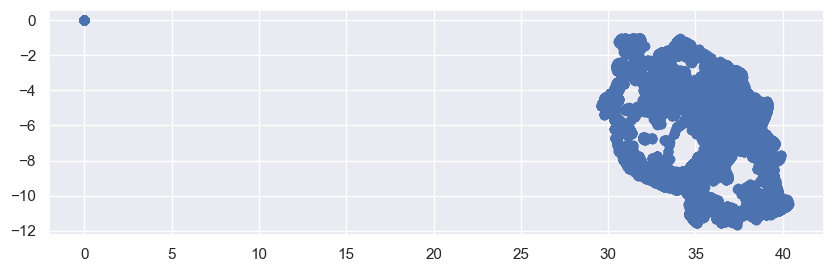

In [44]:
# identificamos un grupo de puntos alocados fuera del territorio
GLocation.plot()

### 03.05.02 Prueba de imputación de variables geoespaciales

In [45]:
# realizamos pruebas de imputación geoespacial en torno a la variable basin
list_basin = DataGeo[DataGeo.gps_height.eq(0.0)&DataGeo.longitude.eq(0.000000)&DataGeo.latitude.eq(-2.000000e-08)].basin.unique()
DataBasin = DataGeo[DataGeo.basin.isin(list_basin)]
cols = DataBasin.columns
idx = DataBasin.index

In [46]:
# redefinimos las variables geoespaciales para posterior imputación
DataBasin.loc[DataBasin.gps_height.eq(0.0)&DataBasin.longitude.eq(0.000000)&DataBasin.latitude.eq(-2.000000e-08), ['gps_height','longitude', 'latitude']] = np.nan, np.nan, np.nan

In [47]:
# diccionario
g = defaultdict(LabelEncoder)
# codificación de las variables que utilizaremos para imputar
fit = DataBasin.select_dtypes(exclude=['int', 'float']).apply(lambda x: g[x.name].fit_transform(x))

# utilizamos el diccionario
cols_txt = DataBasin.select_dtypes(exclude=['int', 'float']).columns
DataBasin.loc[:, cols_txt] = DataBasin.select_dtypes(exclude=['int', 'float']).apply(lambda x: g[x.name].transform(x))

In [48]:
# realizamos una imputación iterativa
imputer_itImp = skl_imp.IterativeImputer(max_iter=100, random_state=0)
DataBasin = imputer_itImp.fit_transform(DataBasin)
DataBasin = pd.DataFrame(DataBasin, columns=cols, index=idx)

In [49]:
# decodificamos el resultado
DataBasin.loc[:, cols_txt] = fit.apply(lambda x: g[x.name].inverse_transform(x))

In [50]:
# reemplazamos en el dataset principal
DataTrain.loc[DataTrain.basin.isin(list_basin), ['gps_height', 'longitude', 'latitude']] = DataBasin[['gps_height', 'longitude', 'latitude']]

In [51]:
gdf = gpd.GeoDataFrame(DataTrain 
                       ,geometry=gpd.points_from_xy(DataTrain.longitude, DataTrain.latitude)
                       ,crs="EPSG:4326"
                       )

In [52]:
gdf["area"] = gdf.area

In [53]:
# para representación y evaluación de dependencia espacial codificamos la variable objetivo
label_encoder =LabelEncoder()
# creamos una nueva variable codificada
gdf['label_status_group']= label_encoder.fit_transform(gdf['status_group'])

In [54]:
# mapeamos los nombres para la legenda en la representación gráfica 
le_name_mapping = dict(zip(label_encoder.transform(label_encoder.classes_),label_encoder.classes_))
print(le_name_mapping)

{0: 'functional', 1: 'functional needs repair', 2: 'non functional'}


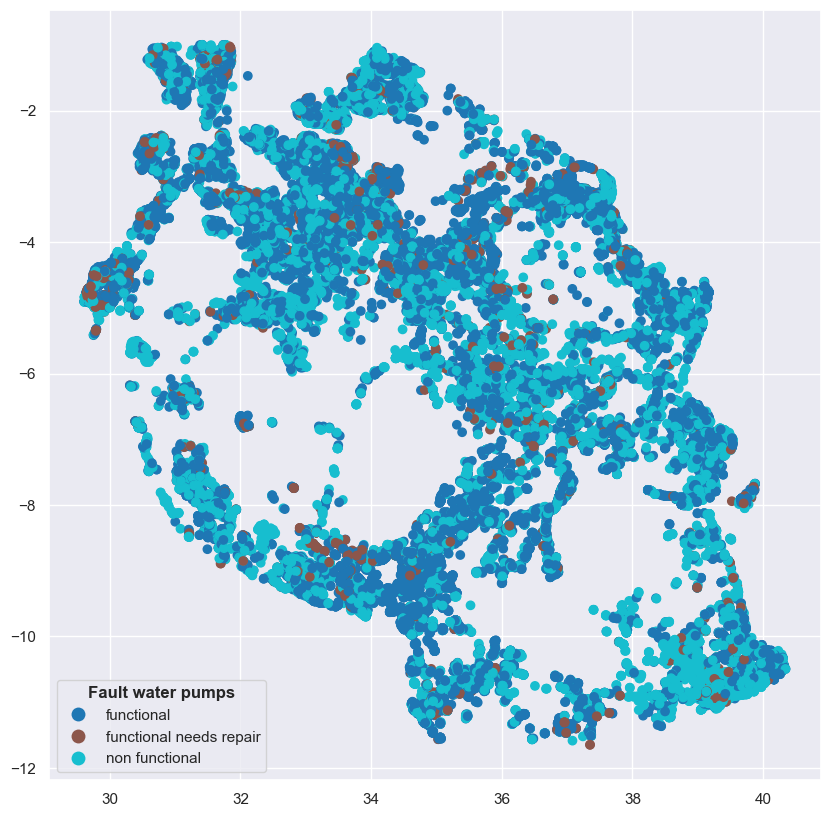

In [55]:
map=gdf.plot(column='label_status_group', 
         legend=True,
         categorical=True,
         figsize=(10,10),
         legend_kwds={'loc': 'lower left'
                      ,'labels':label_encoder.classes_.tolist()
                      ,'title':'Fault water pumps'
                      ,'title_fontproperties':{'weight':'bold'}} 
)
# map.set_axis_off() 

In [56]:
# pesos basados en distancias / K-Nearest Neighbor Weights
WeigMatrix = weights.distance.KNN.from_dataframe(gdf, k=4)

In [57]:
# creación de variables con retardo espacial
gdf["label_status_group_lag"] = weights.lag_categorical(WeigMatrix, gdf["label_status_group"].values.flatten(), ties='random')

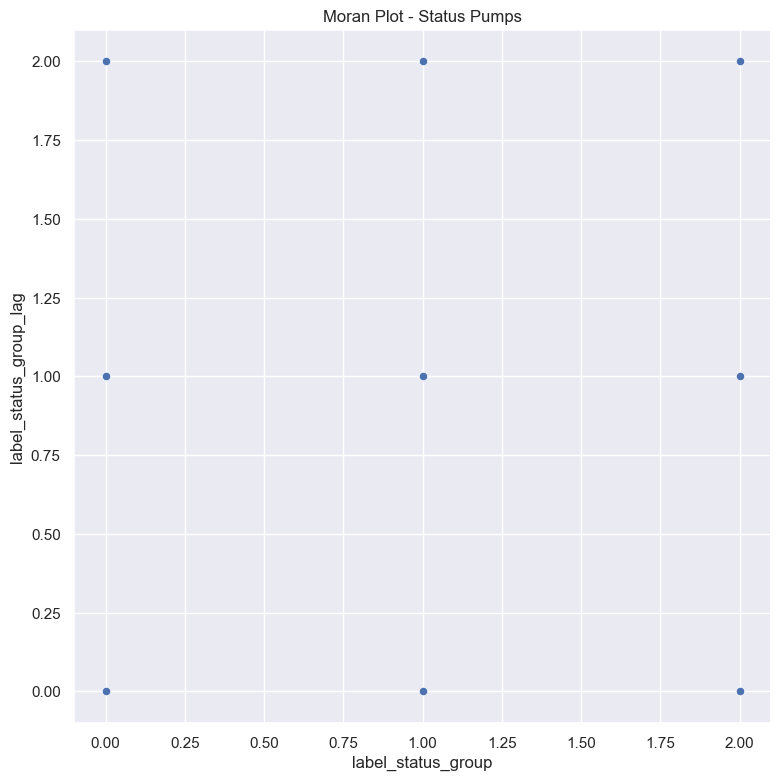

In [58]:
# autocorrelación Espacial
f, ax = plt.subplots(1, figsize=(9, 9))
sns.scatterplot(
    x="label_status_group",
    y="label_status_group_lag",
    # ci=None,
    data=gdf,
    # line_kws={"color": "r"},
)
# ax.axvline(0, c="k", alpha=0.5)
# ax.axhline(0, c="k", alpha=0.5)
ax.set_title("Moran Plot - Status Pumps")
plt.show()

### 03.05.02 Variables temporales

In [59]:
DataTrain.date_recorded.agg(['min', 'max', 'count'])

min      2002-10-14 00:00:00
max      2013-12-03 00:00:00
count                  59400
Name: date_recorded, dtype: object